In [2]:
import pandas as pd

# Đọc dữ liệu từ ba file CSV
file_path1 = '../ecommerce/MSN.csv'
file_path2 = '../ecommerce/PNJ.csv'
file_path3 = '../ecommerce/VIC.csv'

df1 = pd.read_csv(file_path1)
df2 = pd.read_csv(file_path2)
df3 = pd.read_csv(file_path3)

# Thêm một cột mới để phân biệt các mã cổ phiếu
df1['Ticker'] = 'MSN'
df2['Ticker'] = 'PNJ'
df3['Ticker'] = 'VIC'

# Chuyển đổi cột Date/Time thành định dạng datetime
df1['Date/Time'] = pd.to_datetime(df1['Date/Time'])
df2['Date/Time'] = pd.to_datetime(df2['Date/Time'])
df3['Date/Time'] = pd.to_datetime(df3['Date/Time'])

# Kết hợp các DataFrame theo hàng
combined_df = pd.concat([df1, df2, df3], ignore_index=True)

# Sắp xếp dữ liệu theo thời gian và Ticker
combined_df.sort_values(['Date/Time', 'Ticker'], inplace=True)

# Thiết lập tùy chọn hiển thị để xem toàn bộ các cột
pd.set_option('display.max_columns', None)

# Hiển thị thông tin về DataFrame kết hợp sau khi sắp xếp
print(combined_df.info())
print(combined_df.head())


<class 'pandas.core.frame.DataFrame'>
Index: 361929 entries, 0 to 361928
Data columns (total 8 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   Ticker         361929 non-null  object        
 1   Date/Time      361929 non-null  datetime64[ns]
 2   Open           361929 non-null  float64       
 3   High           361929 non-null  float64       
 4   Low            361929 non-null  float64       
 5   Close          361929 non-null  float64       
 6   Volume         361929 non-null  int64         
 7   Open Interest  361929 non-null  int64         
dtypes: datetime64[ns](1), float64(4), int64(2), object(1)
memory usage: 24.9+ MB
None
  Ticker           Date/Time  Open  High   Low  Close  Volume  Open Interest
0    MSN 2017-12-25 09:15:00  73.1  73.1  73.1   73.1    4210              0
1    MSN 2017-12-25 09:16:00  73.0  73.0  73.0   73.0    5000              0
2    MSN 2017-12-25 09:18:00  73.5  73.5  73.5   73.5    

In [3]:
#Gía trị lớn nhất

# Lọc các hàng có Ticker là MSN, PNJ, VIC
filtered_df = combined_df[combined_df['Ticker'].isin(['MSN', 'PNJ', 'VIC'])]
# Nhóm theo cột Ticker và tìm giá trị lớn nhất của cột Close cho mỗi nhóm
max_Close_per_ticker = filtered_df.groupby('Ticker')['Close'].max()
# Hiển thị kết quả
print(max_Close_per_ticker)


Ticker
MSN    118.00
PNJ    100.16
VIC    126.50
Name: Close, dtype: float64


In [4]:
#Gía trị nhỏ nhất

# Lọc các hàng có Ticker là MSN, PNJ, VIC
filtered_df = combined_df[combined_df['Ticker'].isin(['MSN', 'PNJ', 'VIC'])]
# Nhóm theo cột Ticker và tìm giá trị nhỏ nhất của cột Close cho mỗi nhóm
min_Close_per_ticker = filtered_df.groupby('Ticker')['Close'].min()
# Hiển thị kết quả
print(min_Close_per_ticker)

Ticker
MSN    46.40
PNJ    44.14
VIC    68.00
Name: Close, dtype: float64


In [5]:
# giá trung bình
# Lọc các hàng có Ticker là MSN, PNJ, VIC
filtered_df = combined_df[combined_df['Ticker'].isin(['MSN', 'PNJ', 'VIC'])]
# Nhóm theo cột Ticker và tìm giá trị nhỏ nhất của cột Close cho mỗi nhóm
mean_Close_per_ticker = filtered_df.groupby('Ticker')['Close'].mean()
# Hiển thị kết quả
print(mean_Close_per_ticker)

Ticker
MSN     74.880759
PNJ     72.179371
VIC    105.378791
Name: Close, dtype: float64


In [6]:
# Giả sử bạn đã có DataFrame combined_df với cột 'Date/Time', 'Ticker', và 'Close'
combined_df['Date/Time'] = pd.to_datetime(combined_df['Date/Time'])

# Lọc các hàng có Ticker là MSN, PNJ, VIC
filtered_df = combined_df[combined_df['Ticker'].isin(['MSN', 'PNJ', 'VIC'])]

# Xác định khoảng thời gian N (phút, giờ, hoặc ngày)
N = 1  # Có thể là phút (1), giờ (60), hoặc ngày (1440)

# Lấy 'Date/Time' nhỏ nhất của từng ticker
min_dates = filtered_df.groupby('Ticker')['Date/Time'].min()

# Tạo một DataFrame để lưu trữ kết quả cuối cùng
final_df = pd.DataFrame()

# Tính toán biến động giá cổ phiếu cho từng Ticker
for ticker in ['MSN', 'PNJ', 'VIC']:
    # Lọc dữ liệu cho từng Ticker
    ticker_df = filtered_df[(filtered_df['Ticker'] == ticker) & (filtered_df['Date/Time'] >= min_dates[ticker])].copy()
    
    # Đặt thời gian làm chỉ số và sắp xếp dữ liệu theo thời gian
    ticker_df = ticker_df.set_index('Date/Time').sort_index()
    
    # Kiểm tra xem có đủ dữ liệu để tính toán không
    if len(ticker_df) > N:
        # Tính giá cổ phiếu hiện tại
        ticker_df['Current_Price'] = ticker_df['Close']
        
        # Tính giá cổ phiếu N phút, giờ, hoặc ngày sau thời gian mốc
        ticker_df['Future_Price'] = ticker_df['Current_Price'].shift(-N)
        
        # Tính biến động giá cổ phiếu
        ticker_df['Price_Change'] = (ticker_df['Future_Price'] - ticker_df['Current_Price']) 
        
        # Loại bỏ các hàng chứa giá trị NaN trong 'Price_Change'
        ticker_df = ticker_df.dropna(subset=['Price_Change'])
        
        # Chọn cột Date/Time và biến động giá cổ phiếu
        ticker_df = ticker_df[['Current_Price', 'Future_Price', 'Price_Change']].reset_index()
        ticker_df = ticker_df.rename(columns={'Price_Change': ticker + '_price_change'})
        
        # Kết hợp dữ liệu vào DataFrame final_df
        if final_df.empty:
            final_df = ticker_df
        else:
            final_df = pd.merge(final_df, ticker_df, on='Date/Time', how='outer')

# Chọn các cột liên quan đến biến động giá cổ phiếu và bỏ qua NaN
price_change_columns = [col for col in final_df.columns if 'price_change' in col]
filtered_final_df = final_df[['Date/Time'] + price_change_columns].dropna()

# Hiển thị kết quả
print(filtered_final_df.head())

                Date/Time  MSN_price_change  PNJ_price_change  \
40102 2018-10-17 09:39:00               0.0              1.64   
40103 2018-10-17 09:40:00               0.0             -1.72   
40104 2018-10-17 09:41:00               0.2              0.08   
40105 2018-10-17 09:42:00               0.0              0.07   
40106 2018-10-17 09:43:00               0.0              0.07   

       VIC_price_change  
40102               0.0  
40103               0.1  
40104               0.0  
40105               0.1  
40106               0.0  


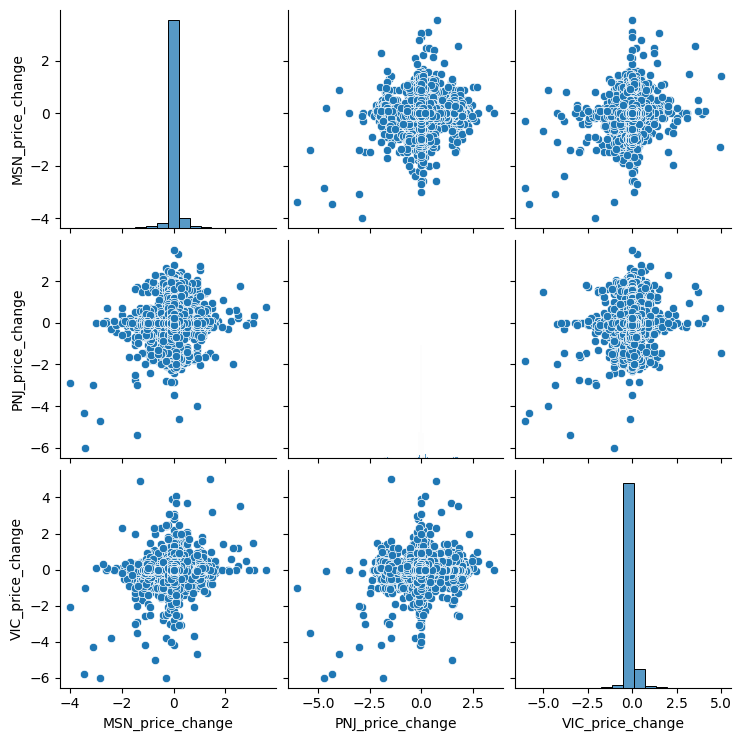

In [7]:
import seaborn as sns
sns.pairplot(filtered_final_df)

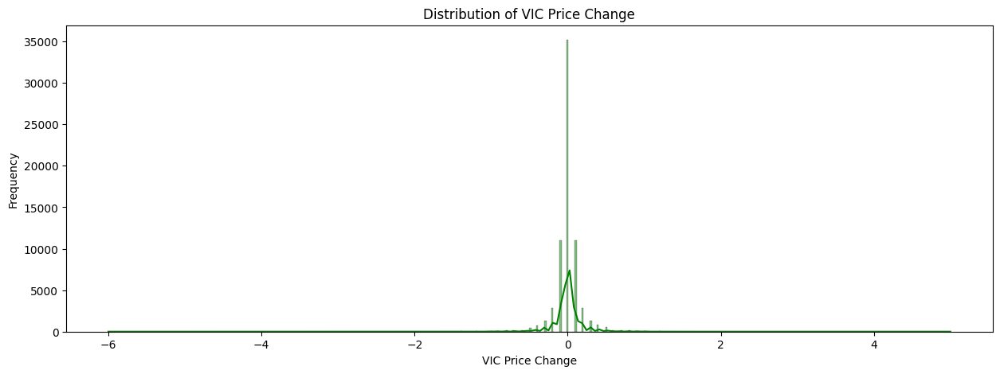

In [8]:
import matplotlib.pyplot as plt

# Đảm bảo lọc các giá trị không phải NaN
vic_price_changes = filtered_final_df['VIC_price_change'].dropna()

# Thiết lập kích thước của hình vẽ
plt.figure(figsize=(15,5))

# Vẽ đồ thị phân phối của biến động giá cổ phiếu VIC với đường KDE
sns.histplot(vic_price_changes, color='green', bins=500, kde=True)

# Thiết lập tiêu đề và nhãn trục
plt.title('Distribution of VIC Price Change')
plt.xlabel('VIC Price Change')
plt.ylabel('Frequency')

# Hiển thị đồ thị
plt.show()

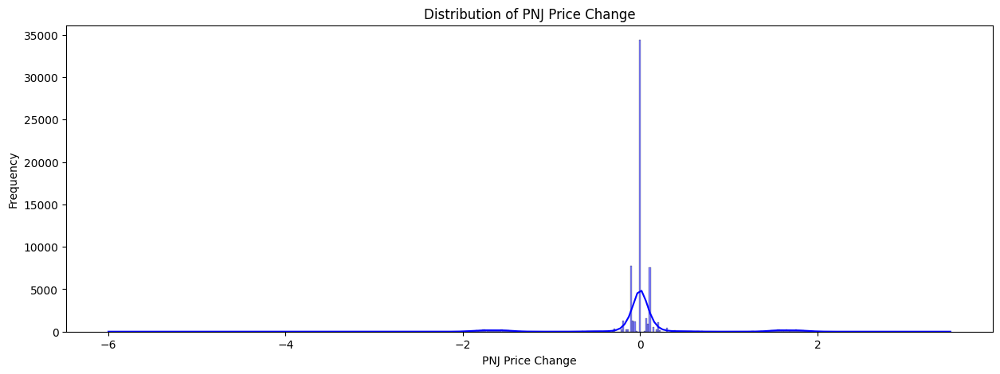

In [9]:
import matplotlib.pyplot as plt

# Đảm bảo lọc các giá trị không phải NaN
pnj_price_changes = filtered_final_df['PNJ_price_change'].dropna()

# Thiết lập kích thước của hình vẽ
plt.figure(figsize=(15,5))

# Vẽ đồ thị phân phối của biến động giá cổ phiếu PNJ với đường KDE
sns.histplot(pnj_price_changes, color='blue', bins=500, kde=True)

# Thiết lập tiêu đề và nhãn trục
plt.title('Distribution of PNJ Price Change')
plt.xlabel('PNJ Price Change')
plt.ylabel('Frequency')

# Hiển thị đồ thị
plt.show()

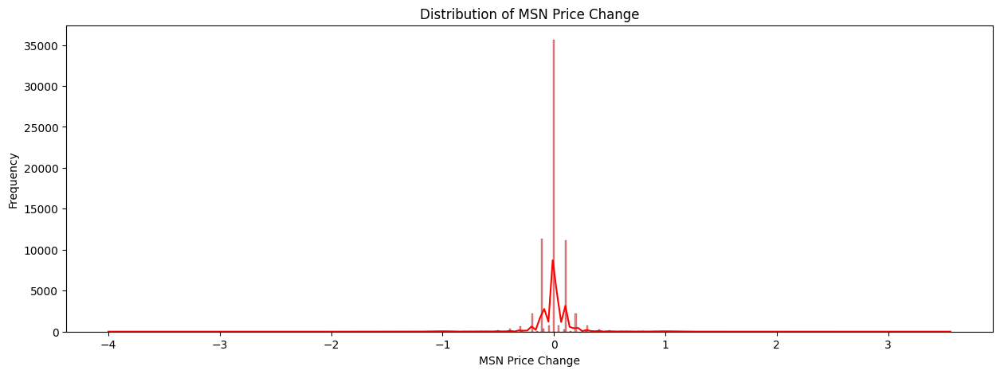

In [10]:
import matplotlib.pyplot as plt

# Đảm bảo lọc các giá trị không phải NaN
msn_price_changes = filtered_final_df['MSN_price_change'].dropna()

# Thiết lập kích thước của hình vẽ
plt.figure(figsize=(15,5))

# Vẽ đồ thị phân phối của biến động giá cổ phiếu PNJ với đường KDE
sns.histplot(msn_price_changes, color='red', bins=500, kde=True)

# Thiết lập tiêu đề và nhãn trục
plt.title('Distribution of MSN Price Change')
plt.xlabel('MSN Price Change')
plt.ylabel('Frequency')

# Hiển thị đồ thị
plt.show()

In [11]:
import plotly.graph_objects as go
import pandas as pd


filtered_df = pd.DataFrame(combined_df)

# Đảm bảo 'Ngày/Giờ' ở định dạng ngày giờ
filtered_df['Date/Time'] = pd.to_datetime(filtered_df['Date/Time'], errors='coerce')

# Lọc dữ liệu cho từng mã chứng khoán
vic_data = filtered_df[filtered_df['Ticker'] == 'VIC'].dropna(subset=['Close', 'Date/Time'])
pnj_data = filtered_df[filtered_df['Ticker'] == 'PNJ'].dropna(subset=['Close', 'Date/Time'])
msn_data = filtered_df[filtered_df['Ticker'] == 'MSN'].dropna(subset=['Close', 'Date/Time'])

# Tạo dấu vết cho từng mã chứng khoán
trace_vic = go.Scatter(x=vic_data['Date/Time'], y=vic_data['Close'], mode='lines', name='VIC Close Price', line=dict(color='green'))
trace_pnj = go.Scatter(x=pnj_data['Date/Time'], y=pnj_data['Close'], mode='lines', name='PNJ Close Price', line=dict(color='blue'))
trace_msn = go.Scatter(x=msn_data['Date/Time'], y=msn_data['Close'], mode='lines', name='MSN Close Price', line=dict(color='red'))

# Tạo hình và thêm dấu vết
fig = go.Figure()
fig.add_trace(trace_vic)
fig.add_trace(trace_pnj)
fig.add_trace(trace_msn)

# Cập nhật giao diện
fig.update_layout(title='Close Prices of VIC, PNJ, and MSN Stocks',
                  xaxis_title='Date',
                  yaxis_title='Close Price')

# Hiển thị giao diện
fig.show()


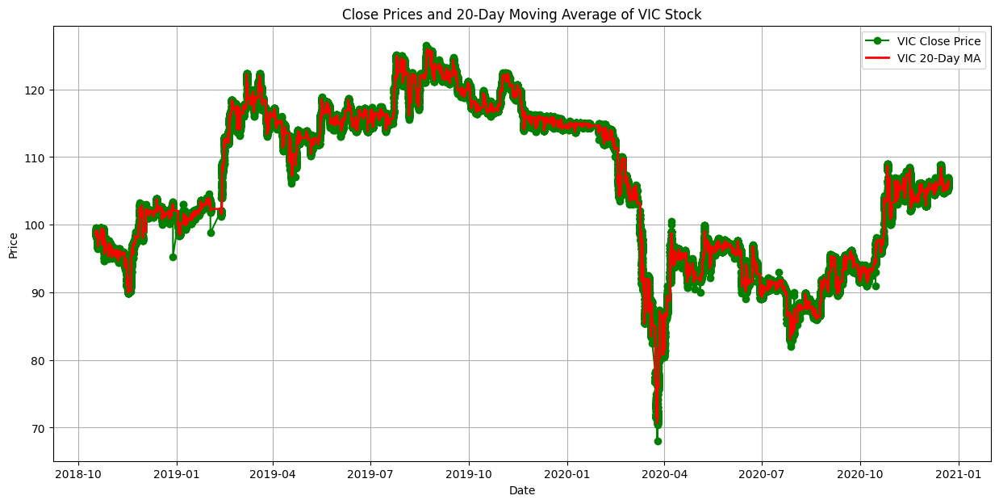

In [12]:
import matplotlib.pyplot as plt

# Lọc dữ liệu cho cổ phiếu VIC cụ thể
vic_df = filtered_df[filtered_df['Ticker'] == 'VIC'].copy()

# Giả sử bạn có một cột thời gian và đã sắp xếp theo thời gian
# Đảm bảo cột 'Date/Time' là kiểu dữ liệu datetime
vic_df['Date/Time'] = pd.to_datetime(vic_df['Date/Time'])

# Tính toán đường trung bình động 20 ngày
vic_df.loc[:, 'MA20'] = vic_df['Close'].rolling(window=20).mean()

# Thiết lập kích thước của hình vẽ
plt.figure(figsize=(15, 7))

# Vẽ đồ thị giá đóng cửa cho VIC với các điểm dữ liệu
plt.plot(vic_df['Date/Time'], vic_df['Close'], color='green', label='VIC Close Price', linestyle='-', marker='o')

# Vẽ đồ thị đường trung bình động MA20 cho VIC với độ dày của đường
plt.plot(vic_df['Date/Time'], vic_df['MA20'], color='red', linestyle='-', linewidth=2, label='VIC 20-Day MA')

# Thiết lập tiêu đề và nhãn trục
plt.title('Close Prices and 20-Day Moving Average of VIC Stock')
plt.xlabel('Date')
plt.ylabel('Price')

# Thêm legend để phân biệt các đường
plt.legend()

# Thêm grid để dễ đọc
plt.grid(True)

# Hiển thị đồ thị
plt.show()


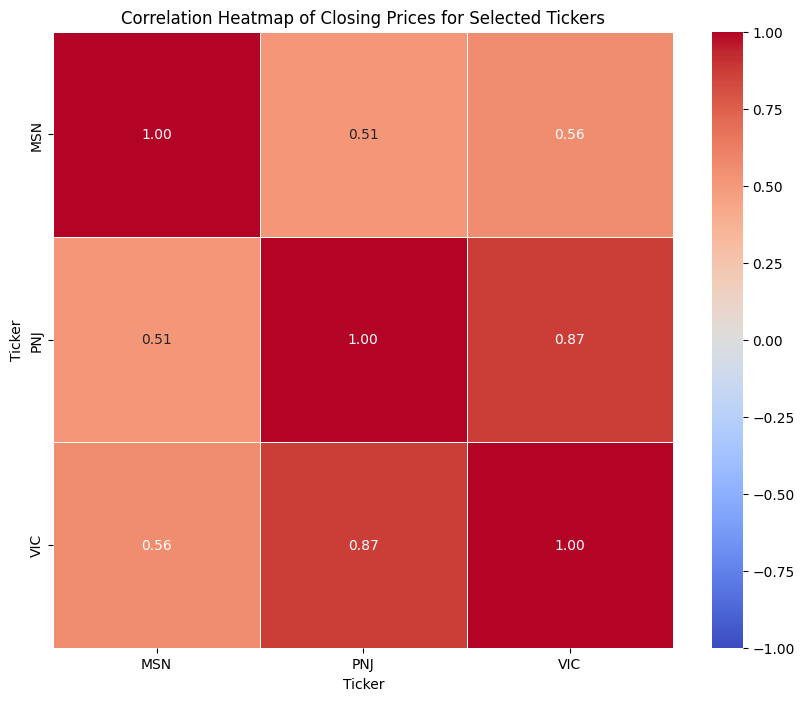

In [13]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Giả sử bạn đã có DataFrame filtered_df
# Chọn dữ liệu cho ba ticker
tickers = ['VIC', 'PNJ', 'MSN']  # Thay 'TICKER2' và 'TICKER3' bằng các ticker thực tế của bạn
filtered_df_tickers = filtered_df[filtered_df['Ticker'].isin(tickers)].copy()

# Pivot dữ liệu để có giá đóng cửa của các ticker
pivot_df = filtered_df_tickers.pivot_table(index='Date/Time', columns='Ticker', values='Close')

# Tính toán ma trận tương quan
correlation_matrix = pivot_df.corr()

# Thiết lập kích thước của hình vẽ
plt.figure(figsize=(10, 8))

# Vẽ bản đồ nhiệt của ma trận tương quan
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1, fmt='.2f', linewidths=0.5)

# Thiết lập tiêu đề
plt.title('Correlation Heatmap of Closing Prices for Selected Tickers')

# Hiển thị bản đồ nhiệt
plt.show()


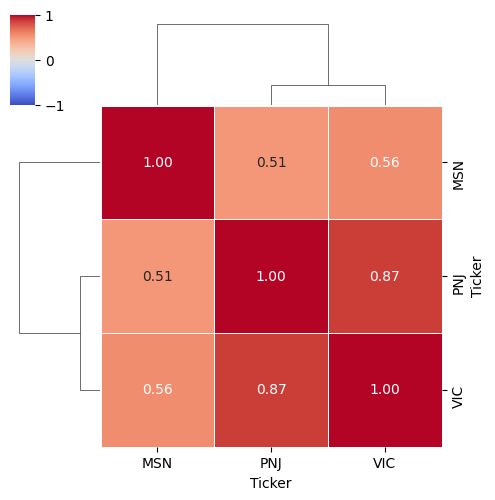

In [14]:
sns.clustermap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1, fmt='.2f', linewidths=0.5, figsize=(5, 5))


In [15]:
from sklearn.preprocessing import MinMaxScaler # chuẩn hóa dữ liệu
from keras.callbacks import ModelCheckpoint # Lưu lại huấn luyện tốt nhất
from tensorflow.keras.models import load_model #tải mô hình

# các lớp để xây dựng mô hình
from keras.models import Sequential
from keras.layers import LSTM #học phụ thuộc 
from keras.layers import Dropout #tránh học tủ
from keras.layers import Dense # luu lại huấn luyện tốt nhất

#kiểm tra độ chính xác của mô hình 
from sklearn.metrics import r2_score # đo mức độ phù hợp
from sklearn.metrics import mean_absolute_error # đo sai số tuyệt đối trung bình
from sklearn.metrics import mean_absolute_percentage_error  # đo phần trăm sai số tuyệt đối trung bình




In [17]:
import numpy as np
#xử lí dữ liệu thuộc MSN
# Lọc các hàng có Ticker là MSN
filtered_df = combined_df[combined_df['Ticker'] == 'MSN']

# Trích xuất các giá trị của cột Close cho MSN
dataset = filtered_df['Close'].values

# Tính độ dài của dữ liệu huấn luyện (80% của tập dữ liệu)
training_data_len = int(np.ceil(len(dataset) * 0.80))

# Hiển thị kết quả
training_data_len


108284

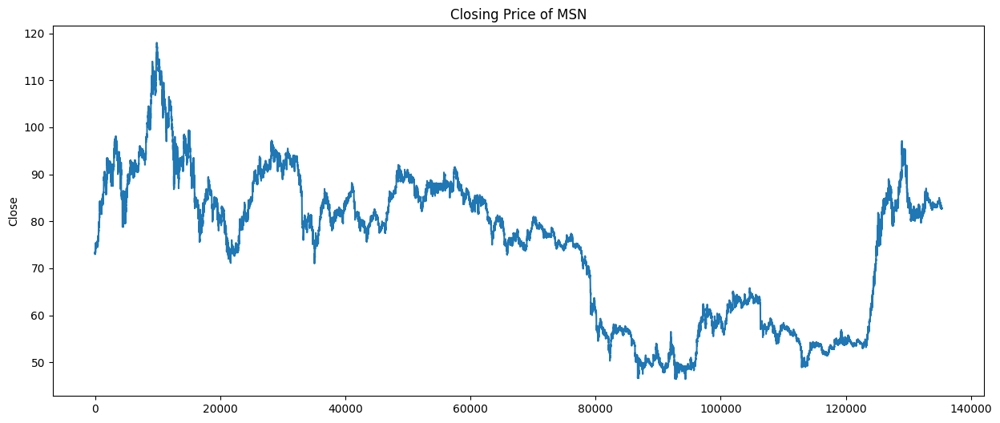

In [ ]:
# giá đóng cửa MSN
plt.figure(figsize=(15,6))
filtered_df['Close'].plot()
plt.ylabel('Close')
plt.xlabel(None)
plt.title('Closing Price of MSN')
plt.show()


In [ ]:
from sklearn.preprocessing import MinMaxScaler

# Lọc các hàng có Ticker là MSN
filtered_df = combined_df[combined_df['Ticker'] == 'MSN']

# Trích xuất các giá trị của cột Close cho MSN
dataset = filtered_df['Close'].values

# Chuyển đổi thành mảng 2D
dataset = dataset.reshape(-1, 1)

# Áp dụng MinMaxScaler
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(dataset)

# Hiển thị kết quả
scaled_data


array([[0.37290503],
       [0.37150838],
       [0.37849162],
       ...,
       [0.50837989],
       [0.50837989],
       [0.50837989]])

In [ ]:
import numpy as np
# tạo tệp huấn luyện và chia tệp dữ liệu train theo tỷ lệ
train_data= scaled_data[0:int(training_data_len),:]
x_train=[]
y_train=[]
for i in range(60,len(train_data)):
    x_train.append(train_data[i-60:i,0])
    y_train.append(train_data[i,0])
    if i<=61:
        print(x_train)
        print(y_train)
        print()
x_train,y_train=np.array(x_train),np.array(y_train)
x_train = np.reshape(x_train,(x_train.shape[0],x_train.shape[1],1))


[array([0.37290503, 0.37150838, 0.37849162, 0.37290503, 0.37150838,
       0.37290503, 0.37290503, 0.37569832, 0.37849162, 0.37569832,
       0.37290503, 0.37290503, 0.37290503, 0.37569832, 0.37569832,
       0.37569832, 0.37430168, 0.37569832, 0.37569832, 0.37430168,
       0.37290503, 0.37430168, 0.37290503, 0.37150838, 0.37150838,
       0.37150838, 0.37150838, 0.37290503, 0.37150838, 0.37150838,
       0.37290503, 0.37290503, 0.37290503, 0.37430168, 0.37569832,
       0.37569832, 0.37849162, 0.38268156, 0.38268156, 0.38547486,
       0.38547486, 0.38547486, 0.38547486, 0.38826816, 0.38547486,
       0.38547486, 0.38547486, 0.38547486, 0.38547486, 0.38826816,
       0.38687151, 0.38687151, 0.38687151, 0.38687151, 0.38547486,
       0.38407821, 0.38407821, 0.38268156, 0.38128492, 0.38128492])]
[0.3840782122905029]

[array([0.37290503, 0.37150838, 0.37849162, 0.37290503, 0.37150838,
       0.37290503, 0.37290503, 0.37569832, 0.37849162, 0.37569832,
       0.37290503, 0.37290503, 0.372

In [ ]:
model=Sequential()
model.add(LSTM(128,return_sequences=True, input_shape=(x_train.shape[1],1)))
model.add(LSTM(64,return_sequences=False))
model.add(Dense(25))
model.add(Dense(1))
model.compile(optimizer='adam',loss='mean_squared_error')
model.fit(x_train,y_train,batch_size=1,epochs=5)

C:\Users\Xin chao Duy Tan\AppData\Roaming\Python\Python312\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/5
108224/108224 ━━━━━━━━━━━━━━━━━━━━ 1255s 12ms/step - loss: 1.7317e-04
Epoch 2/5
108224/108224 ━━━━━━━━━━━━━━━━━━━━ 1089s 10ms/step - loss: 2.7944e-05
Epoch 3/5
108224/108224 ━━━━━━━━━━━━━━━━━━━━ 1129s 10ms/step - loss: 2.2069e-05
Epoch 4/5
108224/108224 ━━━━━━━━━━━━━━━━━━━━ 1255s 12ms/step - loss: 1.9167e-05
Epoch 5/5
108224/108224 ━━━━━━━━━━━━━━━━━━━━ 1228s 11ms/step - loss: 1.7882e-05


In [ ]:
test_data = scaled_data[training_data_len -60: ,:]
x_test=[];
y_test = dataset[training_data_len:, :]
for i in range (60, len(test_data)):
    x_test.append(test_data[i-60:i, 0])
x_test=np.array(x_test)
x_test=np.reshape(x_test,(x_test.shape[0],x_test.shape[1],1))
predictions=model.predict(x_test)
predictions= scaler.inverse_transform(predictions)

846/846 ━━━━━━━━━━━━━━━━━━━━ 12s 14ms/step


In [ ]:
# đánh giá độ chính xác mô hình thông qua rmse
rmse=np.sqrt(np.mean(((predictions-y_test)**2)))
rmse

0.2862406492299632

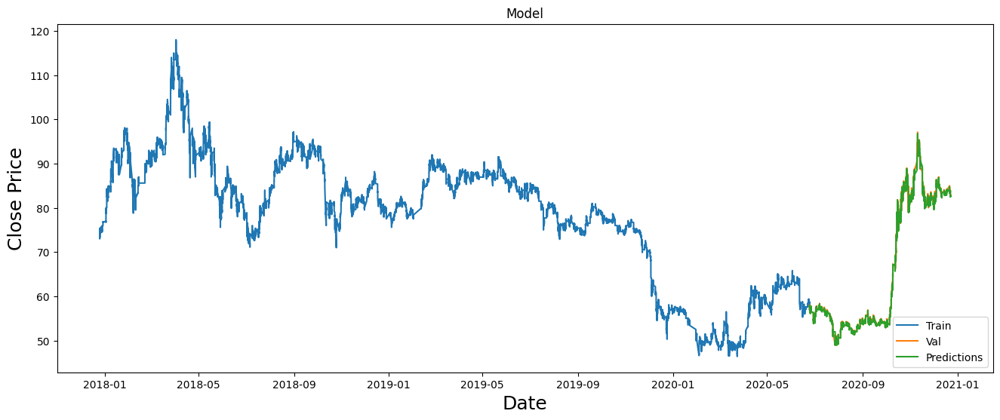

In [ ]:
 #Giả sử combined_df có cột 'date/time' và 'Ticker'
# Lọc các hàng có Ticker là MSN
filtered_dfMSN = combined_df[combined_df['Ticker'] == 'MSN']

# Trích xuất các giá trị của cột Close cho MSN
close_prices = filtered_dfMSN['Close'].values

# Lấy cột 'date/time' cho ticker MSN
dates = filtered_dfMSN['Date/Time']

# Chuyển đổi close_prices thành mảng 2D nếu cần
close_prices = close_prices.reshape(-1, 1)

# Chia dữ liệu thành train và valid
training_data_len = int(np.ceil(len(close_prices) * 0.80))
train_close = close_prices[:training_data_len]
valid_close = close_prices[training_data_len:]

# Chuyển đổi train và valid thành DataFrame
train = pd.DataFrame(train_close, columns=['Close'])
valid = pd.DataFrame(valid_close, columns=['Close'])

# Thêm cột date/time vào DataFrame
train['Date'] = dates.iloc[:training_data_len].values
valid['Date'] = dates.iloc[training_data_len:].values
# Thêm cột Predictions vào DataFrame valid
valid['Predictions'] = predictions

# Đảm bảo cột Date được định dạng đúng và đặt làm chỉ số
train['Date'] = pd.to_datetime(train['Date'])
valid['Date'] = pd.to_datetime(valid['Date'])
train.set_index('Date', inplace=True)
valid.set_index('Date', inplace=True)

# Vẽ biểu đồ
plt.figure(figsize=(16, 6))
plt.title('Model')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price', fontsize=18)
plt.plot(train['Close'])
plt.plot(valid[['Close', 'Predictions']])
plt.legend(['Train', 'Val', 'Predictions'], loc='lower right')
plt.show()

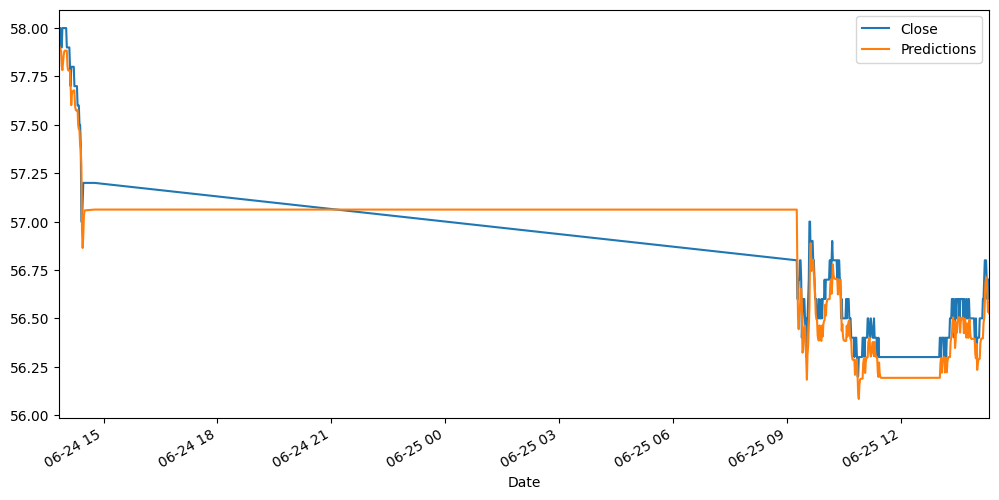

In [ ]:
valid[['Close','Predictions']].iloc[:250].plot(figsize=(12,6)).autoscale(axis='x',tight=True)

In [ ]:
valid

,Close,Predictions
Date,,
2020-06-24 13:50:00,58.0,57.910007
2020-06-24 13:52:00,58.0,57.888023
2020-06-24 13:53:00,57.9,57.883186
2020-06-24 13:54:00,57.9,57.804115
2020-06-24 13:55:00,58.0,57.782757
...,...,...
2020-12-22 14:23:00,82.8,82.656036
2020-12-22 14:24:00,82.8,82.662193
2020-12-22 14:25:00,82.8,82.663559
